In [ ]:
import kagglehub
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.linear_model import RidgeCV, Ridge, Lasso, LassoCV, ElasticNetCV, LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [ ]:
path = kagglehub.dataset_download('akashbommidi/2026-qs-world-university-rankings')
print(path)

/kaggle/input/2026-qs-world-university-rankings


In [ ]:
for all_files in os.listdir(path):
  if all_files.endswith('.csv'):
    filepath = os.path.join(path, all_files)
filepath


'/kaggle/input/2026-qs-world-university-rankings/2026 QS World University Rankings.csv'

In [ ]:
df = pd.read_csv(filepath)

In [ ]:
df.head()

,2026 Rank,Previous Rank,Institution Name,Country/Territory,Region,Size,Focus,Research,Status,AR SCORE,AR RANK,ER SCORE,ER RANK,FSR SCORE,FSR RANK,CPF SCORE,CPF RANK,IFR SCORE,IFR RANK,ISR SCORE,ISR RANK,ISD SCORE,ISD RANK,IRN SCORE,IRN RANK,EO SCORE,EO RANK,SUS SCORE,SUS RANK,Overall SCORE
0,1,1,Massachusetts Institute of Technology (MIT),United States of America,Americas,M,CO,VH,Private not for Profit,100.0,4,100.0,2,100.0,16,100.0,7,100.0,63,91.6,153,92.3,130,94.1,98,100.0,7,93.8,33,100
1,2,2,Imperial College London,United Kingdom,Europe,L,FO,VH,Public,99.6,22,100.0,9,99.3,42,95.0,69,100.0,74,100.0,35,100.0,22,97.5,28,95.9,68,98.3,7=,99.4
2,3,6,Stanford University,United States of America,Americas,L,FC,VH,Private not for Profit,100.0,5,100.0,3,100.0,17,99.7,24,94.2,188,73.5,261,76.1,230,96.5,49,100.0,2,95.4,19=,98.9
3,4,3,University of Oxford,United Kingdom,Europe,L,FC,VH,Public,100.0,2,100.0,4,100.0,9,91.0,98,98.8,132,98.6,80,98.7,67,100.0,1,100.0,3,77.9,198=,97.9
4,5,4,Harvard University,United States of America,Americas,L,FC,VH,Private not for Profit,100.0,1,100.0,1,98.3,50,100.0,1,79.1,300,81.4,217,60.6,335,99.4,8,100.0,1,77.8,201=,97.7


In [ ]:
df.tail()

,2026 Rank,Previous Rank,Institution Name,Country/Territory,Region,Size,Focus,Research,Status,AR SCORE,AR RANK,ER SCORE,ER RANK,FSR SCORE,FSR RANK,CPF SCORE,CPF RANK,IFR SCORE,IFR RANK,ISR SCORE,ISR RANK,ISD SCORE,ISD RANK,IRN SCORE,IRN RANK,EO SCORE,EO RANK,SUS SCORE,SUS RANK,Overall SCORE
1496,1401+,1201-1400,University of West Bohemia,Czechia,Europe,M,CO,VH,Public,7.2,701+,5.3,701+,12.5,801+,7.9,801+,NaN,NaN,6.2,801+,4.8,801+,40.9,801+,15.5,801+,19.5,801+,-
1497,1401+,1201-1400,Voronezh State University,Russian Federation,Europe,L,CO,HI,Public,5.7,701+,4.7,701+,31.3,610,1.6,801+,3.7,801+,34.5,546,40.2,502,12.2,801+,3.5,801+,20.4,801+,-
1498,1401+,NaN,Walailak University,Thailand,Asia,L,FC,MD,Public,8.3,701+,2.7,701+,12.5,801+,5.6,801+,13.9,801+,3.0,801+,7.4,801+,31.5,801+,3.2,801+,43.0,801+,-
1499,1401+,1201-1400,Yamaguchi University,Japan,Asia,M,FC,HI,Public,4.4,701+,2.9,701+,46.1,425,8.2,801+,8.0,801+,4.5,801+,8.9,801+,15.4,801+,1.7,801+,22.5,801+,-
1500,1401+,1201-1400,Youngsan University,Republic of Korea,Asia,M,SP,MD,Private for Profit,6.5,701+,11.9,701+,25.6,726,2.0,801+,3.5,801+,25.3,658,24.7,689,2.5,801+,1.9,801+,11.5,801+,-


In [ ]:
df.size

45030

In [ ]:
df.shape

(1501, 30)

In [ ]:
df.duplicated()

,0
0,False
1,False
2,False
3,False
4,False
...,...
1496,False
1497,False
1498,False
1499,False


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1501 entries, 0 to 1500
Data columns (total 30 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   2026 Rank          1501 non-null   object 
 1   Previous Rank      1389 non-null   object 
 2   Institution Name   1501 non-null   object 
 3   Country/Territory  1501 non-null   object 
 4   Region             1501 non-null   object 
 5   Size               1500 non-null   object 
 6   Focus              1501 non-null   object 
 7   Research           1500 non-null   object 
 8   Status             1454 non-null   object 
 9   AR SCORE           1501 non-null   float64
 10  AR RANK            1501 non-null   object 
 11  ER SCORE           1501 non-null   float64
 12  ER RANK            1501 non-null   object 
 13  FSR SCORE          1501 non-null   float64
 14  FSR RANK           1501 non-null   object 
 15  CPF SCORE          1501 non-null   float64
 16  CPF RANK           1501 

In [ ]:
df.describe()

,AR SCORE,ER SCORE,FSR SCORE,CPF SCORE,IFR SCORE,ISR SCORE,ISD SCORE,IRN SCORE,EO SCORE,SUS SCORE
count,1501.000000,1501.000000,1501.000000,1501.000000,1414.000000,1464.00000,1464.000000,1499.000000,1501.000000,1477.000000
mean,25.785943,26.944237,33.950433,30.425516,36.305658,33.32541,34.526981,53.356905,29.989674,51.254367
std,24.500905,25.504494,28.440071,29.679882,35.252024,32.75066,31.108600,28.920632,29.197573,21.266331
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,3.000000
25%,8.800000,8.500000,10.800000,6.000000,6.600000,5.90000,8.675000,27.500000,6.200000,35.700000
50%,16.000000,16.500000,23.500000,18.000000,20.100000,19.40000,21.700000,55.800000,17.900000,48.700000
75%,32.700000,37.500000,50.500000,49.700000,66.100000,56.70000,55.650000,78.500000,46.000000,66.500000
max,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000


In [ ]:
df.nunique()

,0
2026 Rank,399
Previous Rank,385
Institution Name,1501
Country/Territory,106
Region,5
Size,4
Focus,4
Research,4
Status,3
AR SCORE,554


In [ ]:
# Drop columns that might cause leakage.
leakage_columns = ['AR RANK', 'ER RANK','2026 Rank', 'Previous Rank','FSR RANK', 'CPF RANK', 'IFR RANK', 'ISR RANK', 'ISD RANK', 'IRN RANK', 'EO RANK', 'SUS RANK']
df.drop(columns=leakage_columns, inplace=True)
df.shape

(1501, 18)

In [ ]:
# Drop unnecessary columns
un_columns = ['Country/Territory', 'Institution Name']
df.drop(columns=un_columns, inplace=True)
df.head()

,Region,Size,Focus,Research,Status,AR SCORE,ER SCORE,FSR SCORE,CPF SCORE,IFR SCORE,ISR SCORE,ISD SCORE,IRN SCORE,EO SCORE,SUS SCORE,Overall SCORE
0,Americas,M,CO,VH,Private not for Profit,100.0,100.0,100.0,100.0,100.0,91.6,92.3,94.1,100.0,93.8,100
1,Europe,L,FO,VH,Public,99.6,100.0,99.3,95.0,100.0,100.0,100.0,97.5,95.9,98.3,99.4
2,Americas,L,FC,VH,Private not for Profit,100.0,100.0,100.0,99.7,94.2,73.5,76.1,96.5,100.0,95.4,98.9
3,Europe,L,FC,VH,Public,100.0,100.0,100.0,91.0,98.8,98.6,98.7,100.0,100.0,77.9,97.9
4,Americas,L,FC,VH,Private not for Profit,100.0,100.0,98.3,100.0,79.1,81.4,60.6,99.4,100.0,77.8,97.7


In [ ]:
df.isnull().sum()

,0
Region,0
Size,1
Focus,0
Research,1
Status,47
AR SCORE,0
ER SCORE,0
FSR SCORE,0
CPF SCORE,0
IFR SCORE,87


In [ ]:
df['Overall SCORE'].unique()

array(['100', '99.4', '98.9', '97.9', '97.7', '97.2', '96.7', '95.9',
       '95.8', '94.3', '94.2', '93.7', '93', '92.6', '92.5', '91.6',
       '91.2', '90.8', '90.7', '90.4', '90.2', '89.7', '89.4', '88.9',
       '88.6', '88.5', '88.4', '88.3', '87.4', '87.2', '86.4', '85.8',
       '85.6', '85.5', '85.4', '85.1', '84.8', '84.7', '84.4', '84.3',
       '84', '82.9', '82.5', '82.3', '81.5', '81.2', '81.1', '80.5',
       '80.2', '80.1', '79.7', '79.6', '79', '78.9', '77.5', '76.9',
       '76.5', '76.4', '76.2', '75.9', '75.7', '75.2', '73.9', '73.8',
       '73.7', '73.6', '73.4', '73', '72.7', '72.6', '72.3', '72.1', '72',
       '71.2', '71.1', '71', '70.9', '70.3', '70.1', '69.9', '69.4',
       '69.1', '68.5', '68.4', '67.9', '67.7', '67.6', '67.5', '67.3',
       '66.7', '66.6', '66.5', '66.4', '66.3', '66.1', '66', '65.7',
       '65.5', '65.3', '65.2', '64.9', '64.8', '64.5', '64.3', '64.2',
       '64.1', '64', '63.9', '63.3', '63.2', '63.1', '63', '62.8', '62.6',
       '6

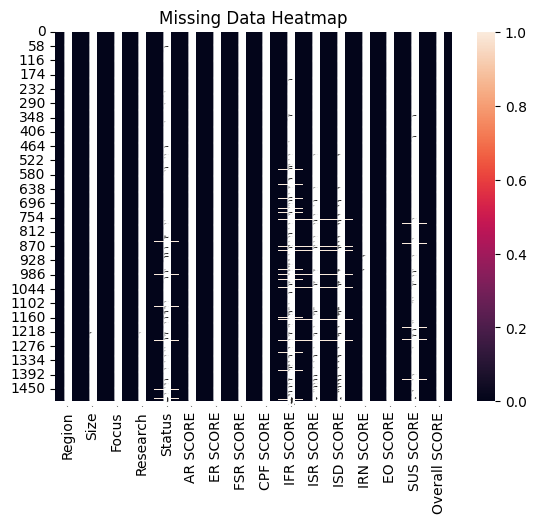

In [ ]:
sns.heatmap(df.isnull(), annot=True)
plt.title("Missing Data Heatmap")
plt.show()

In [ ]:
df['Overall SCORE'] = df['Overall SCORE'].replace('-', np.nan)

In [ ]:
df.isnull().sum()

,0
Region,0
Size,1
Focus,0
Research,1
Status,47
AR SCORE,0
ER SCORE,0
FSR SCORE,0
CPF SCORE,0
IFR SCORE,87


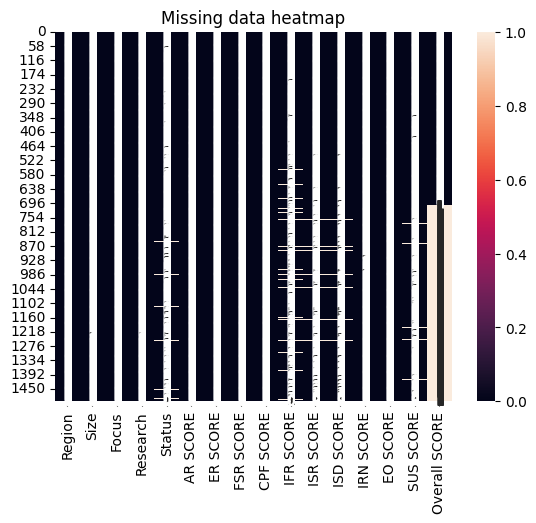

In [ ]:
sns.heatmap(df.isnull(), annot=True)
plt.title("Missing data heatmap")
plt.show()

In [ ]:
df.dropna(inplace=True)

In [ ]:
df.shape

(679, 16)

In [ ]:
df['Overall SCORE'] = df['Overall SCORE'].astype('float')

In [ ]:
df.isnull().sum()

,0
Region,0
Size,0
Focus,0
Research,0
Status,0
AR SCORE,0
ER SCORE,0
FSR SCORE,0
CPF SCORE,0
IFR SCORE,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 679 entries, 0 to 702
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Region         679 non-null    object 
 1   Size           679 non-null    object 
 2   Focus          679 non-null    object 
 3   Research       679 non-null    object 
 4   Status         679 non-null    object 
 5   AR SCORE       679 non-null    float64
 6   ER SCORE       679 non-null    float64
 7   FSR SCORE      679 non-null    float64
 8   CPF SCORE      679 non-null    float64
 9   IFR SCORE      679 non-null    float64
 10  ISR SCORE      679 non-null    float64
 11  ISD SCORE      679 non-null    float64
 12  IRN SCORE      679 non-null    float64
 13  EO SCORE       679 non-null    float64
 14  SUS SCORE      679 non-null    float64
 15  Overall SCORE  679 non-null    float64
dtypes: float64(11), object(5)
memory usage: 90.2+ KB


In [ ]:
# Relationship Analysis

<Axes: xlabel='Region', ylabel='count'>

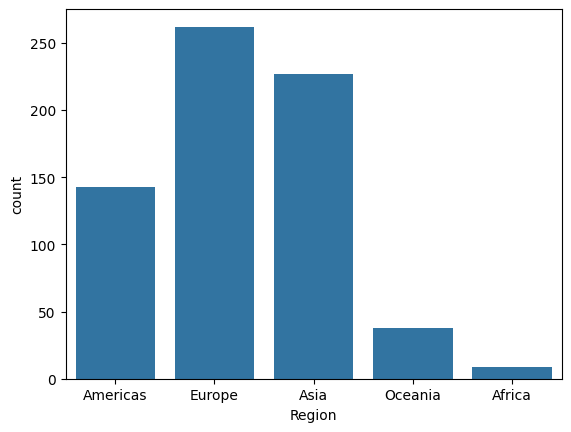

In [ ]:
sns.countplot(df, x='Region')

<Axes: xlabel='Size', ylabel='count'>

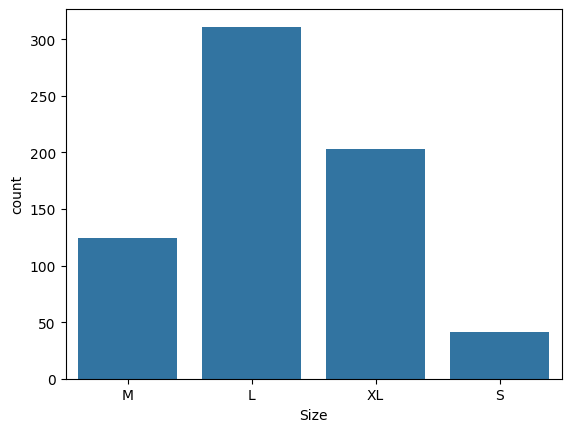

In [ ]:
sns.countplot(df, x='Size')

<Axes: xlabel='Focus', ylabel='count'>

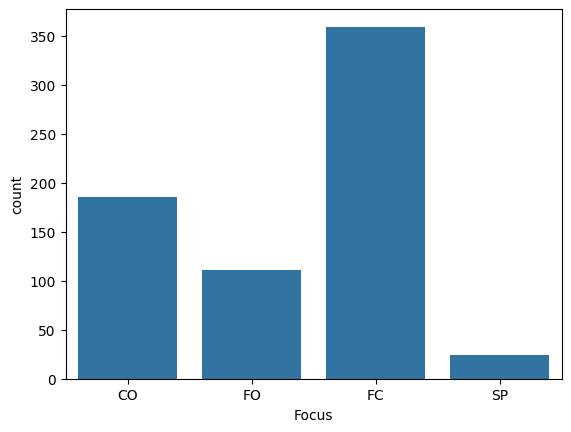

In [ ]:
sns.countplot(df, x='Focus')

<Axes: xlabel='Research', ylabel='count'>

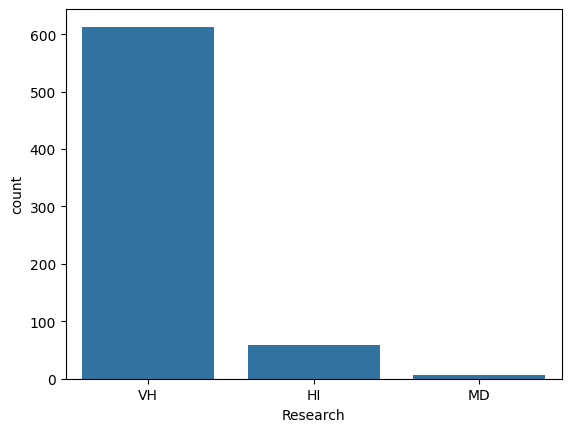

In [ ]:
sns.countplot(df, x='Research')

<Axes: xlabel='Status', ylabel='count'>

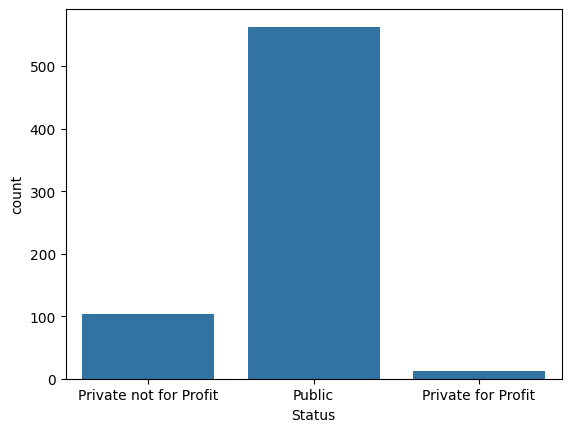

In [ ]:
sns.countplot(df, x='Status')

<Axes: >

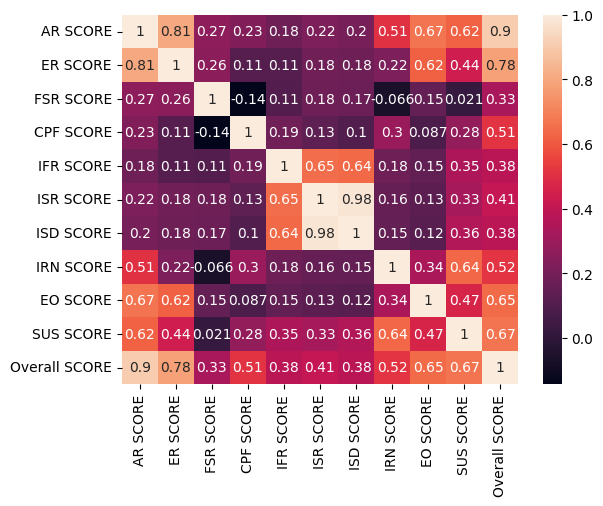

In [ ]:
correlation = df.select_dtypes(float).corr()
sns.heatmap(correlation, annot=True)

In [ ]:
# Remove columns that might cause multi-collinearity
multicol_cols = ['ISD SCORE', 'ER SCORE']
df.drop(columns=multicol_cols, inplace=True)

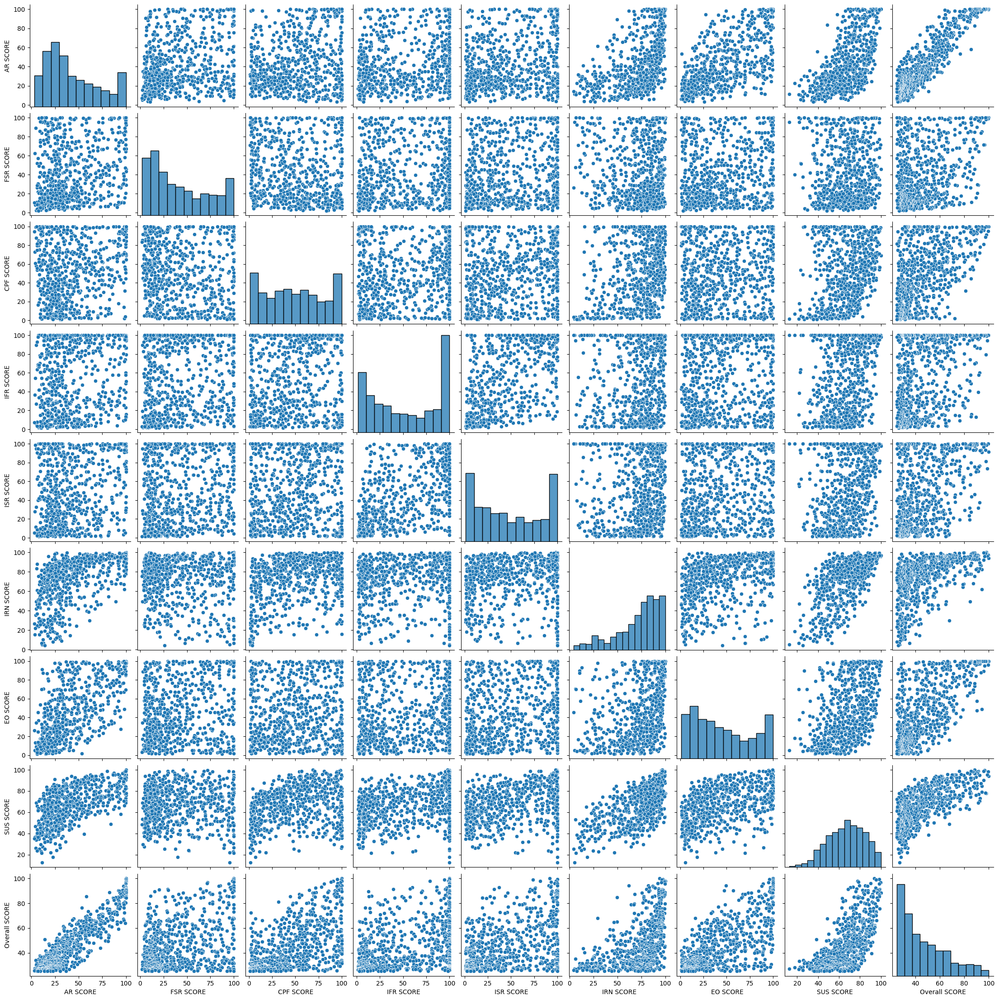

In [ ]:
sns.pairplot(df)

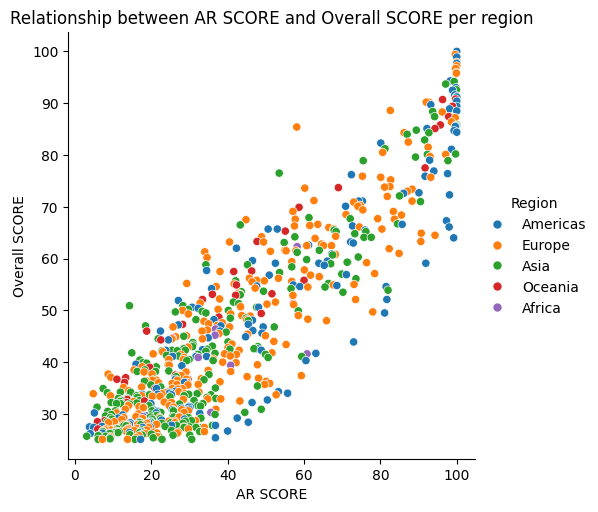

In [ ]:
sns.relplot(data=df, hue='Region', x='AR SCORE', y='Overall SCORE')
plt.title('Relationship between AR SCORE and Overall SCORE per region')
plt.show()

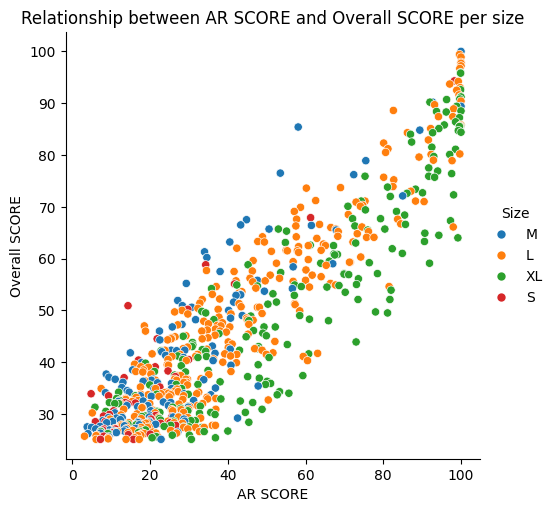

In [ ]:
sns.relplot(data=df, hue='Size', x='AR SCORE', y='Overall SCORE')
plt.title('Relationship between AR SCORE and Overall SCORE per size')
plt.show()

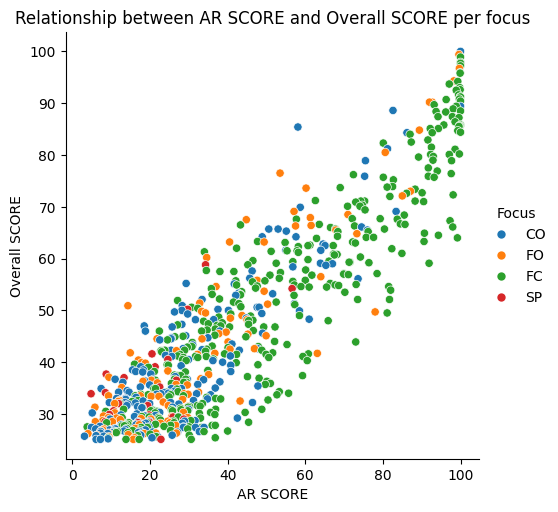

In [ ]:
sns.relplot(data=df, hue='Focus', x='AR SCORE', y='Overall SCORE')
plt.title('Relationship between AR SCORE and Overall SCORE per focus')
plt.show()

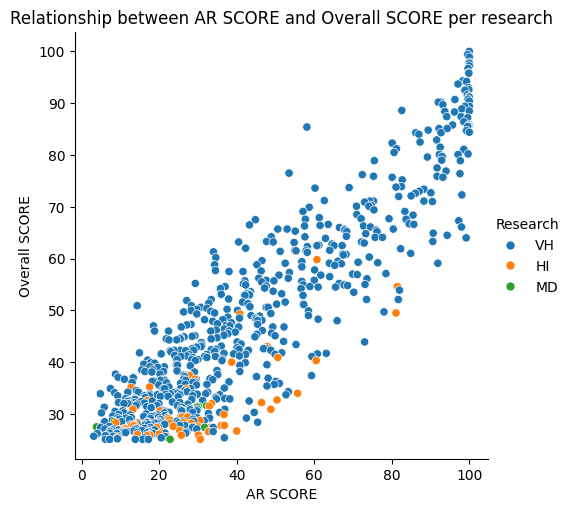

In [ ]:
sns.relplot(data=df, hue='Research', x='AR SCORE', y='Overall SCORE')
plt.title('Relationship between AR SCORE and Overall SCORE per research')
plt.show()

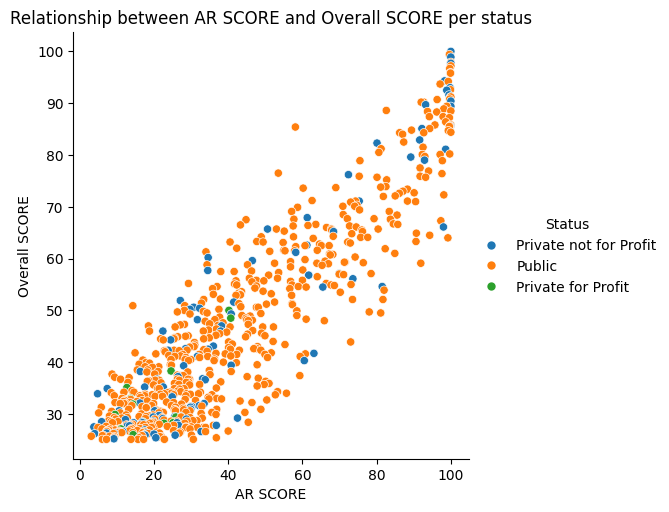

In [ ]:
sns.relplot(data=df, hue='Status', x='AR SCORE', y='Overall SCORE')
plt.title('Relationship between AR SCORE and Overall SCORE per status')
plt.show()

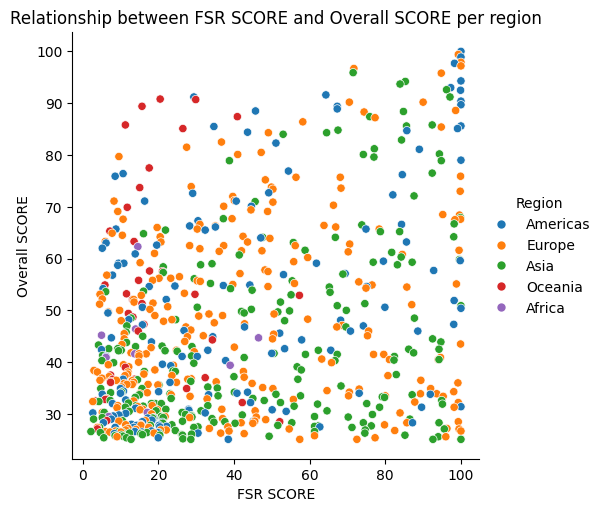

In [ ]:
sns.relplot(data=df, hue='Region', x='FSR SCORE', y='Overall SCORE')
plt.title('Relationship between FSR SCORE and Overall SCORE per region')
plt.show()

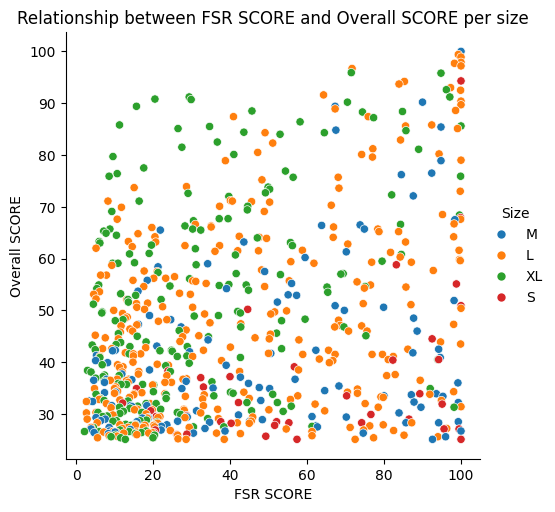

In [ ]:
sns.relplot(data=df, hue='Size', x='FSR SCORE', y='Overall SCORE')
plt.title('Relationship between FSR SCORE and Overall SCORE per size')
plt.show()

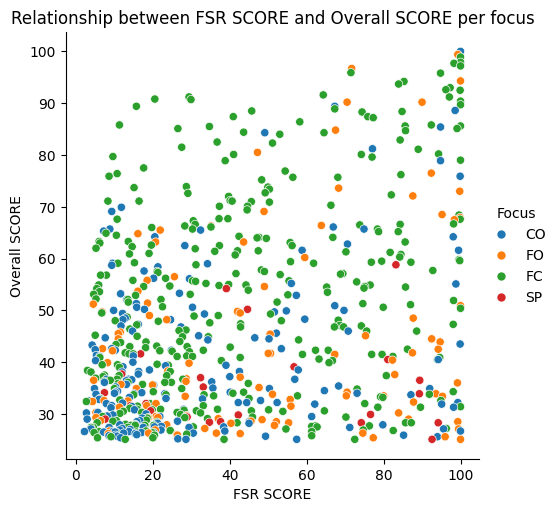

In [ ]:
sns.relplot(data=df, hue='Focus', x='FSR SCORE', y='Overall SCORE')
plt.title('Relationship between FSR SCORE and Overall SCORE per focus')
plt.show()

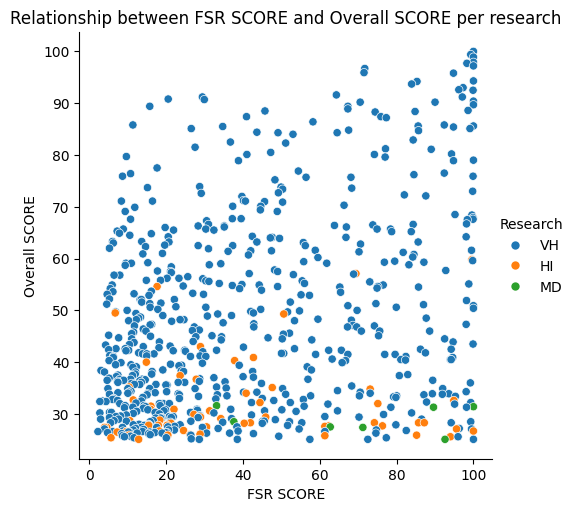

In [ ]:
sns.relplot(data=df, hue='Research', x='FSR SCORE', y='Overall SCORE')
plt.title('Relationship between FSR SCORE and Overall SCORE per research')
plt.show()

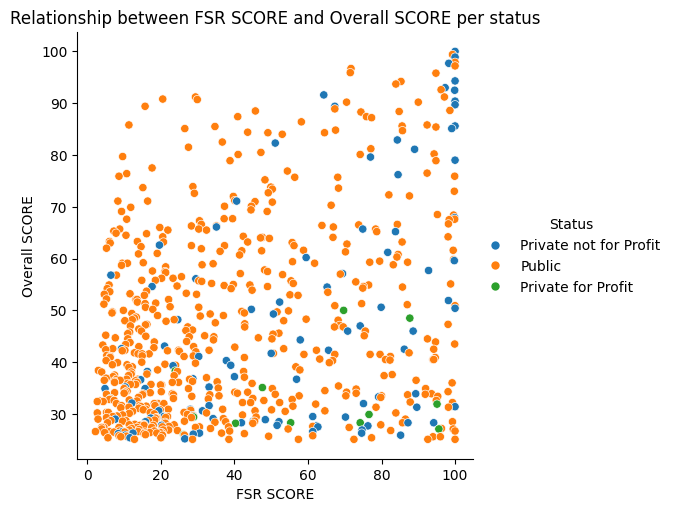

In [ ]:
sns.relplot(data=df, hue='Status', x='FSR SCORE', y='Overall SCORE')
plt.title('Relationship between FSR SCORE and Overall SCORE per status')
plt.show()

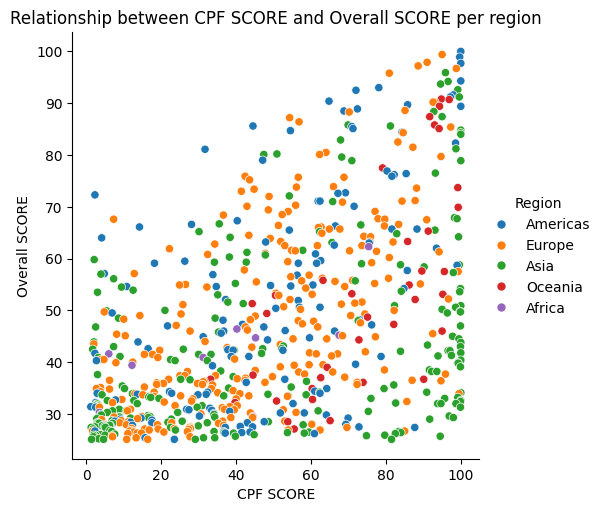

In [ ]:
sns.relplot(data=df, hue='Region', x='CPF SCORE', y='Overall SCORE')
plt.title('Relationship between CPF SCORE and Overall SCORE per region')
plt.show()

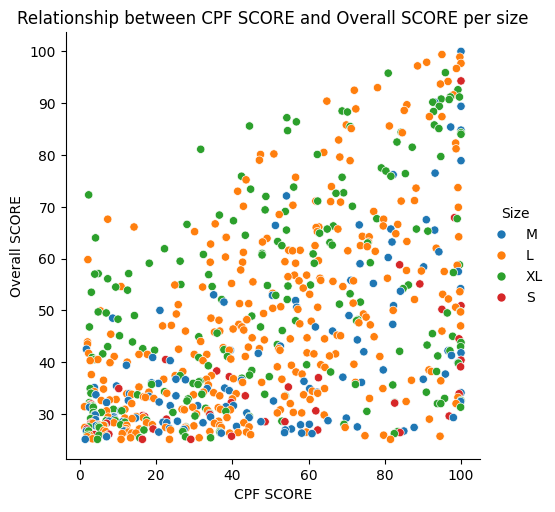

In [ ]:
sns.relplot(data=df, hue='Size', x='CPF SCORE', y='Overall SCORE')
plt.title('Relationship between CPF SCORE and Overall SCORE per size')
plt.show()

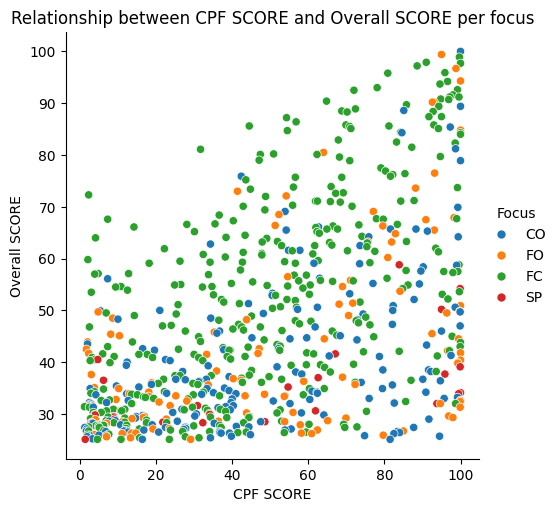

In [ ]:
sns.relplot(data=df, hue='Focus', x='CPF SCORE', y='Overall SCORE')
plt.title('Relationship between CPF SCORE and Overall SCORE per focus')
plt.show()

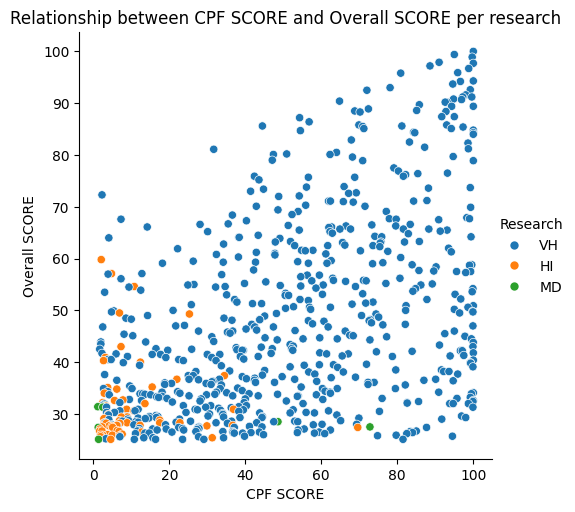

In [ ]:
sns.relplot(data=df, hue='Research', x='CPF SCORE', y='Overall SCORE')
plt.title('Relationship between CPF SCORE and Overall SCORE per research')
plt.show()

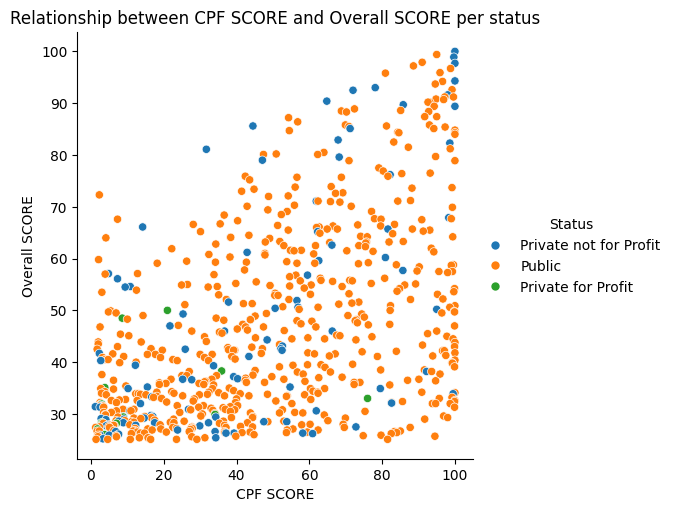

In [ ]:
sns.relplot(data=df, hue='Status', x='CPF SCORE', y='Overall SCORE')
plt.title('Relationship between CPF SCORE and Overall SCORE per status')
plt.show()

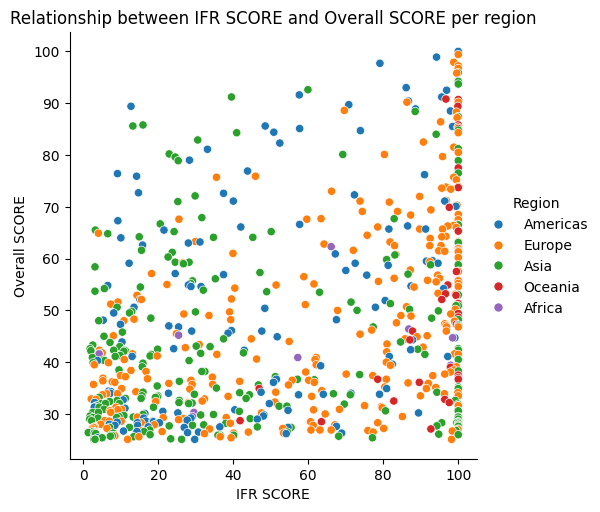

In [ ]:
sns.relplot(data=df, hue='Region', x='IFR SCORE', y='Overall SCORE')
plt.title('Relationship between IFR SCORE and Overall SCORE per region')
plt.show()

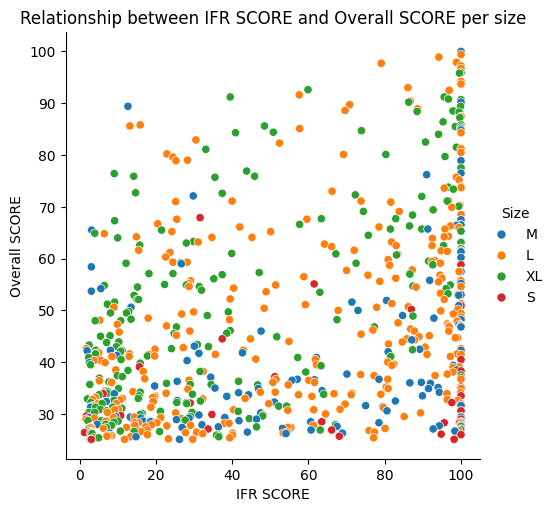

In [ ]:
sns.relplot(data=df, hue='Size', x='IFR SCORE', y='Overall SCORE')
plt.title('Relationship between IFR SCORE and Overall SCORE per size')
plt.show()

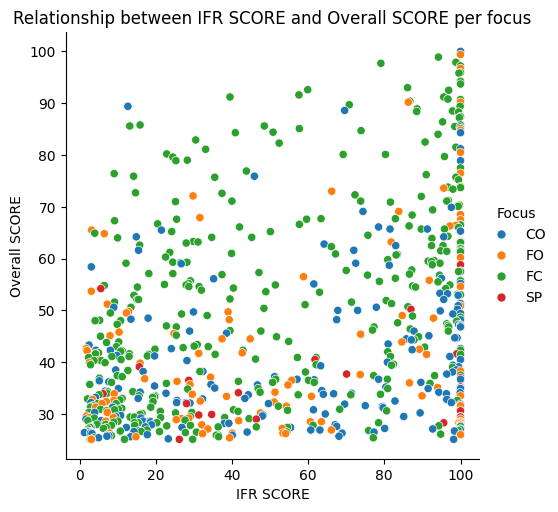

In [ ]:
sns.relplot(data=df, hue='Focus', x='IFR SCORE', y='Overall SCORE')
plt.title('Relationship between IFR SCORE and Overall SCORE per focus')
plt.show()

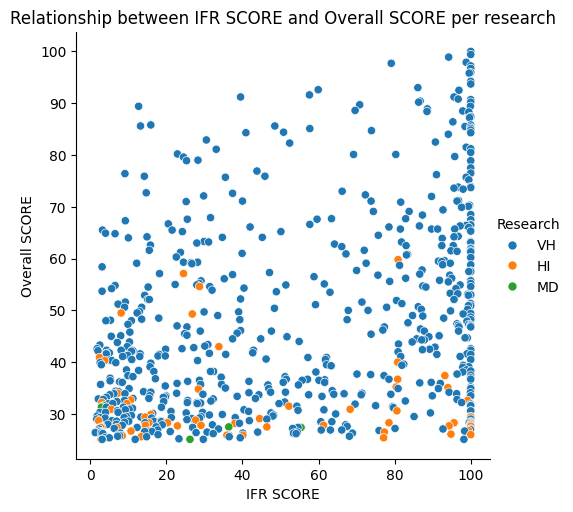

In [ ]:
sns.relplot(data=df, hue='Research', x='IFR SCORE', y='Overall SCORE')
plt.title('Relationship between IFR SCORE and Overall SCORE per research')
plt.show()

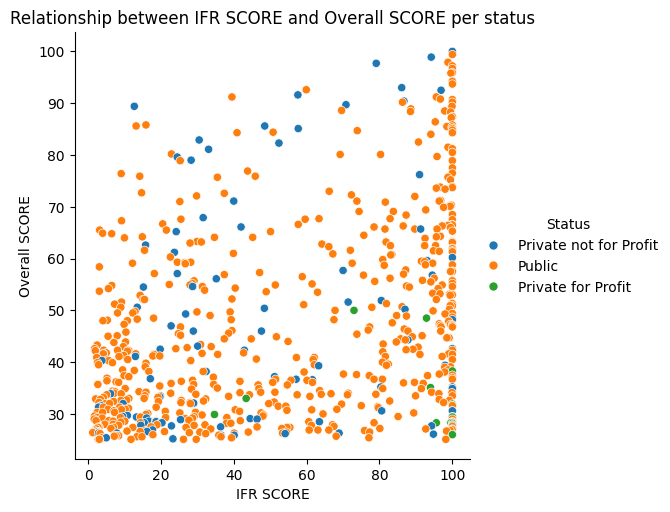

In [ ]:
sns.relplot(data=df, hue='Status', x='IFR SCORE', y='Overall SCORE')
plt.title('Relationship between IFR SCORE and Overall SCORE per status')
plt.show()

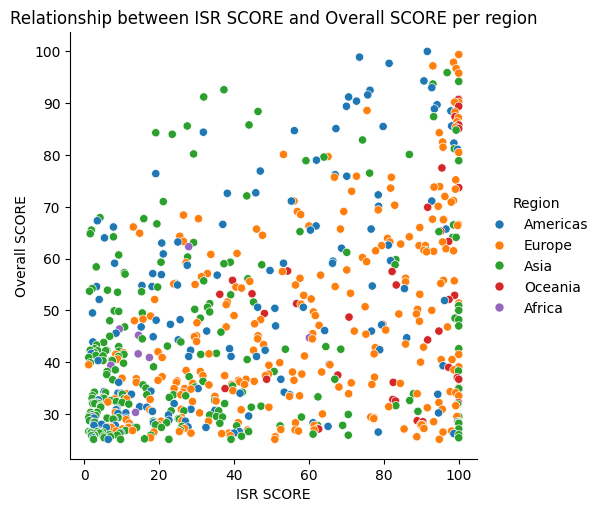

In [ ]:
sns.relplot(data=df, hue='Region', x='ISR SCORE', y='Overall SCORE')
plt.title('Relationship between ISR SCORE and Overall SCORE per region')
plt.show()

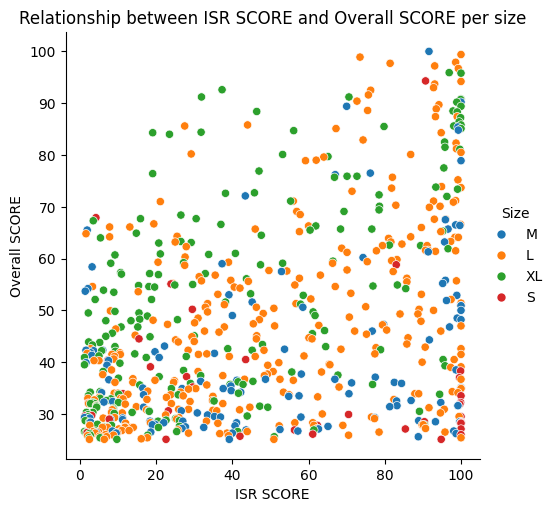

In [ ]:
sns.relplot(data=df, hue='Size', x='ISR SCORE', y='Overall SCORE')
plt.title('Relationship between ISR SCORE and Overall SCORE per size')
plt.show()

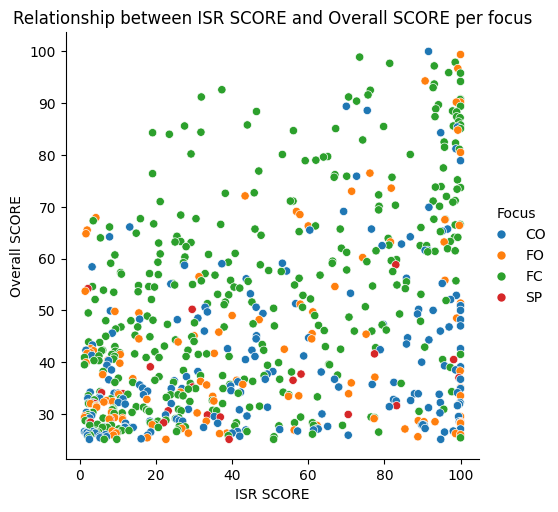

In [ ]:
sns.relplot(data=df, hue='Focus', x='ISR SCORE', y='Overall SCORE')
plt.title('Relationship between ISR SCORE and Overall SCORE per focus')
plt.show()

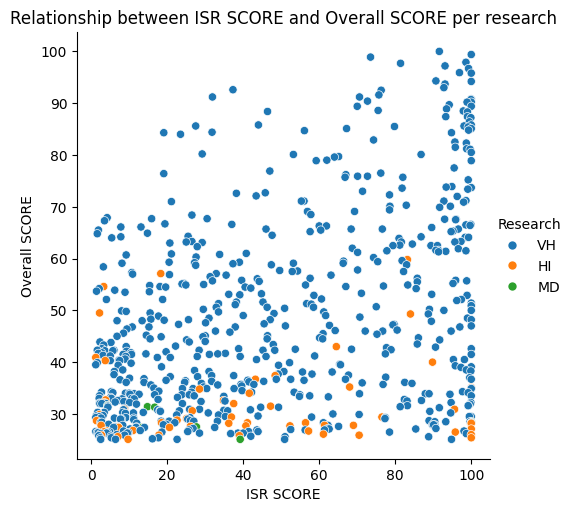

In [ ]:
sns.relplot(data=df, hue='Research', x='ISR SCORE', y='Overall SCORE')
plt.title('Relationship between ISR SCORE and Overall SCORE per research')
plt.show()

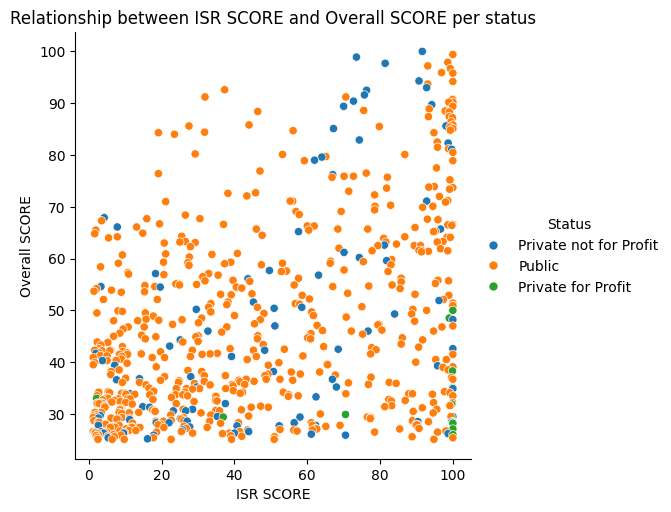

In [ ]:
sns.relplot(data=df, hue='Status', x='ISR SCORE', y='Overall SCORE')
plt.title('Relationship between ISR SCORE and Overall SCORE per status')
plt.show()

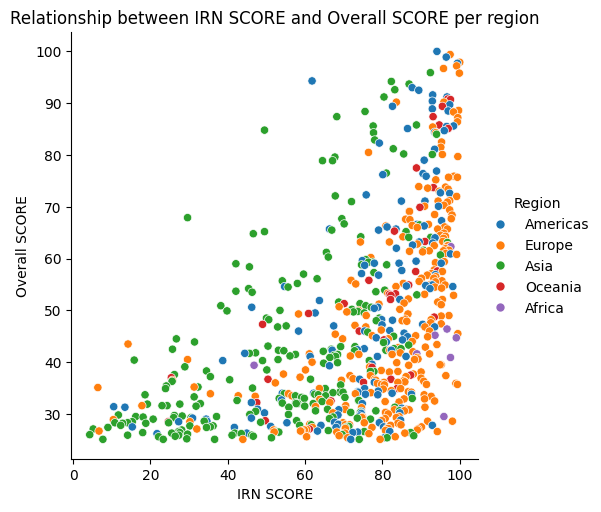

In [ ]:
sns.relplot(data=df, hue='Region', x='IRN SCORE', y='Overall SCORE')
plt.title('Relationship between IRN SCORE and Overall SCORE per region')
plt.show()

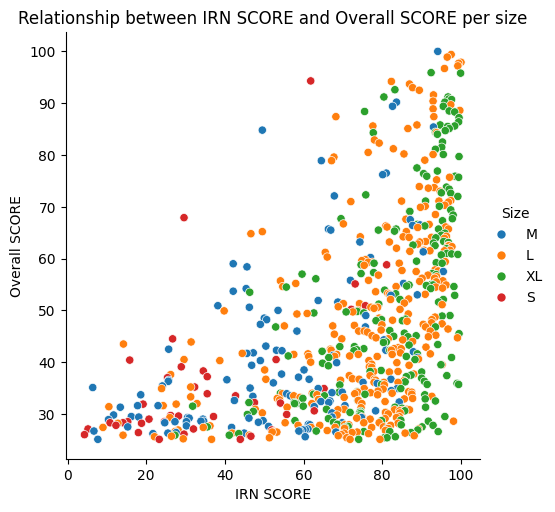

In [ ]:
sns.relplot(data=df, hue='Size', x='IRN SCORE', y='Overall SCORE')
plt.title('Relationship between IRN SCORE and Overall SCORE per size')
plt.show()

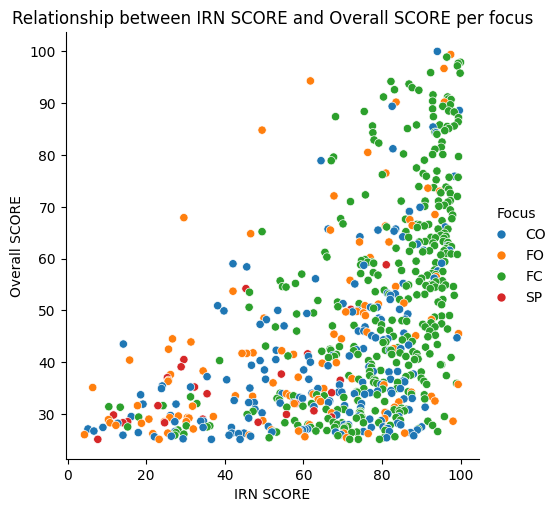

In [ ]:
sns.relplot(data=df, hue='Focus', x='IRN SCORE', y='Overall SCORE')
plt.title('Relationship between IRN SCORE and Overall SCORE per focus')
plt.show()

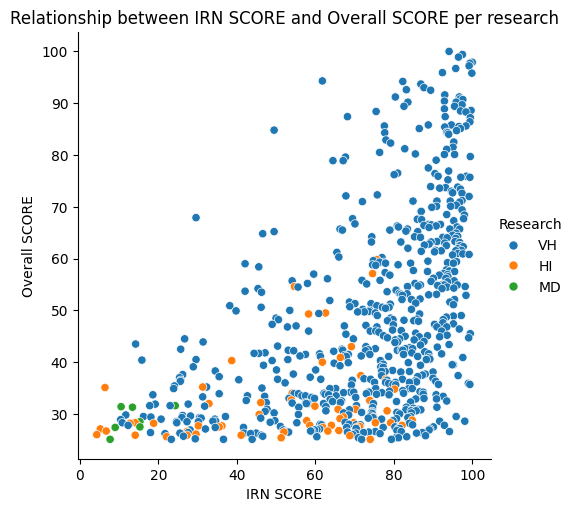

In [ ]:
sns.relplot(data=df, hue='Research', x='IRN SCORE', y='Overall SCORE')
plt.title('Relationship between IRN SCORE and Overall SCORE per research')
plt.show()

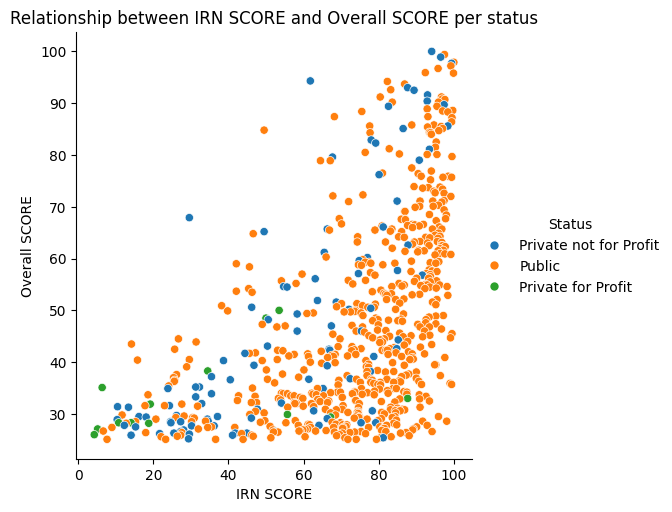

In [ ]:
sns.relplot(data=df, hue='Status', x='IRN SCORE', y='Overall SCORE')
plt.title('Relationship between IRN SCORE and Overall SCORE per status')
plt.show()

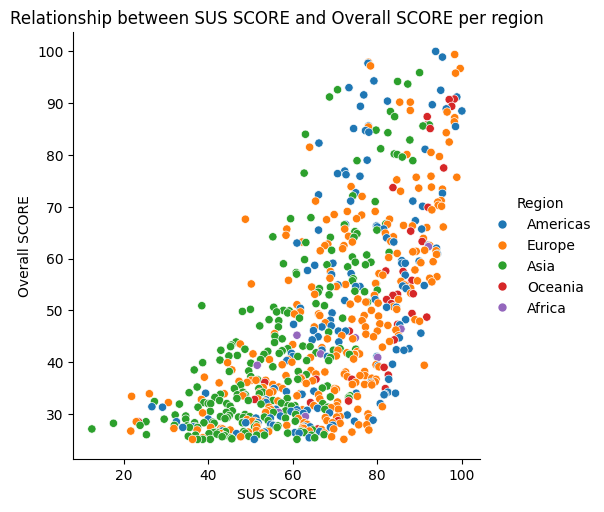

In [ ]:
sns.relplot(data=df, hue='Region', x='SUS SCORE', y='Overall SCORE')
plt.title('Relationship between SUS SCORE and Overall SCORE per region')
plt.show()

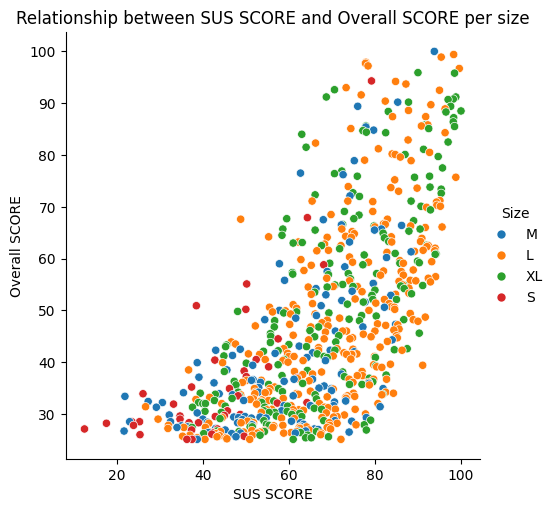

In [ ]:
sns.relplot(data=df, hue='Size', x='SUS SCORE', y='Overall SCORE')
plt.title('Relationship between SUS SCORE and Overall SCORE per size')
plt.show()

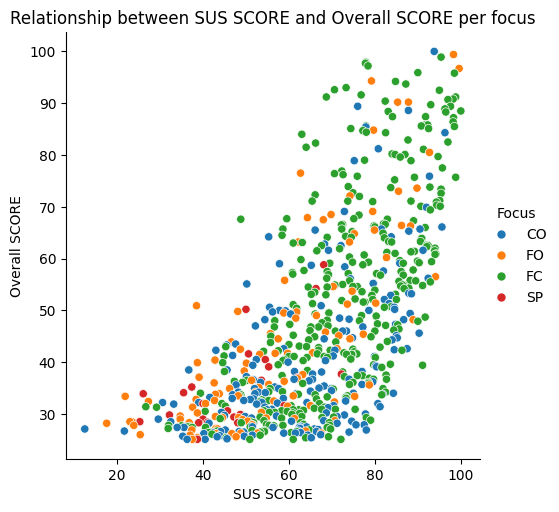

In [ ]:
sns.relplot(data=df, hue='Focus', x='SUS SCORE', y='Overall SCORE')
plt.title('Relationship between SUS SCORE and Overall SCORE per focus')
plt.show()

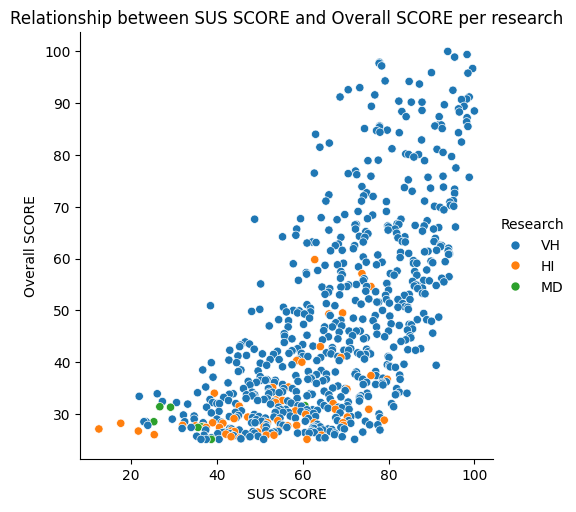

In [ ]:
sns.relplot(data=df, hue='Research', x='SUS SCORE', y='Overall SCORE')
plt.title('Relationship between SUS SCORE and Overall SCORE per research')
plt.show()

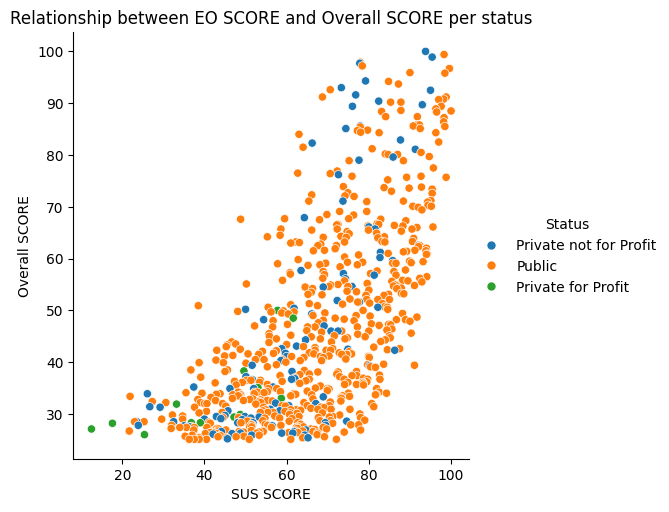

In [ ]:
sns.relplot(data=df, hue='Status', x='SUS SCORE', y='Overall SCORE')
plt.title('Relationship between EO SCORE and Overall SCORE per status')
plt.show()

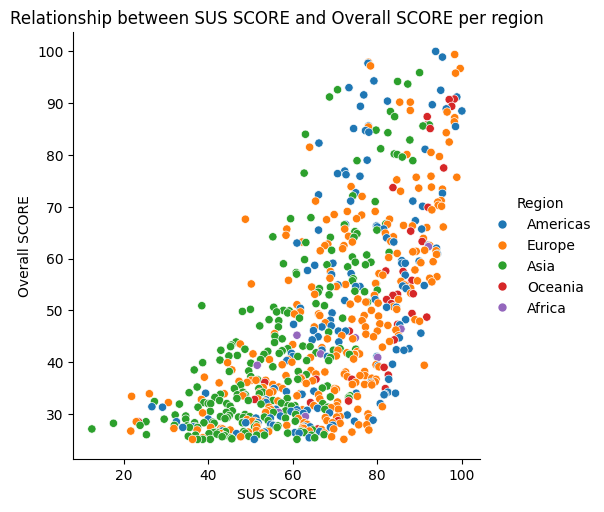

In [ ]:
sns.relplot(data=df, hue='Region', x='SUS SCORE', y='Overall SCORE')
plt.title('Relationship between SUS SCORE and Overall SCORE per region')
plt.show()

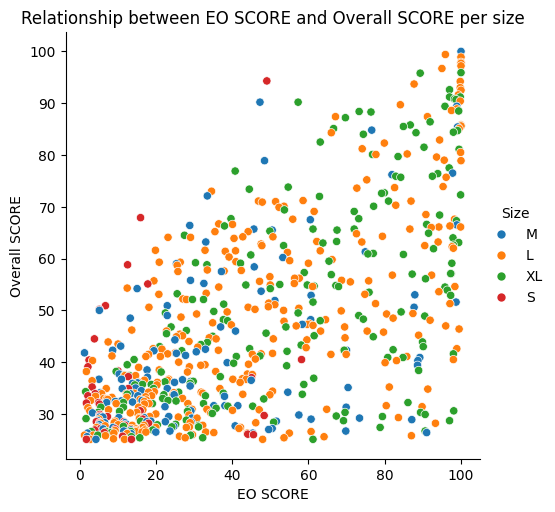

In [ ]:
sns.relplot(data=df, hue='Size', x='EO SCORE', y='Overall SCORE')
plt.title('Relationship between EO SCORE and Overall SCORE per size')
plt.show()

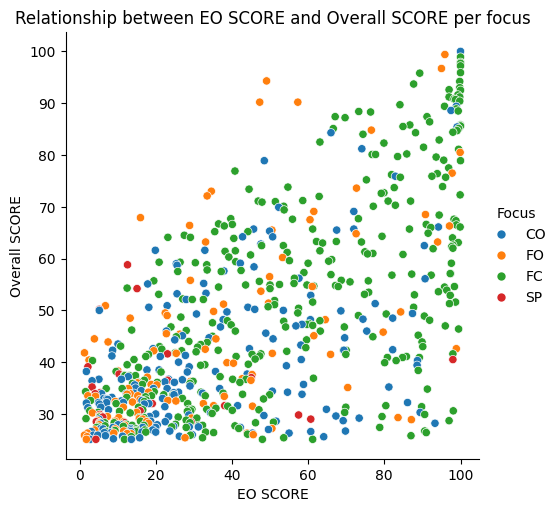

In [ ]:
sns.relplot(data=df, hue='Focus', x='EO SCORE', y='Overall SCORE')
plt.title('Relationship between EO SCORE and Overall SCORE per focus')
plt.show()

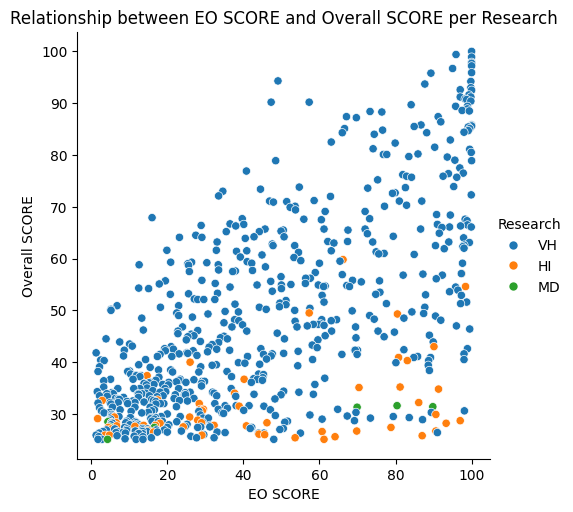

In [ ]:
sns.relplot(data=df, hue='Research', x='EO SCORE', y='Overall SCORE')
plt.title('Relationship between EO SCORE and Overall SCORE per Research')
plt.show()

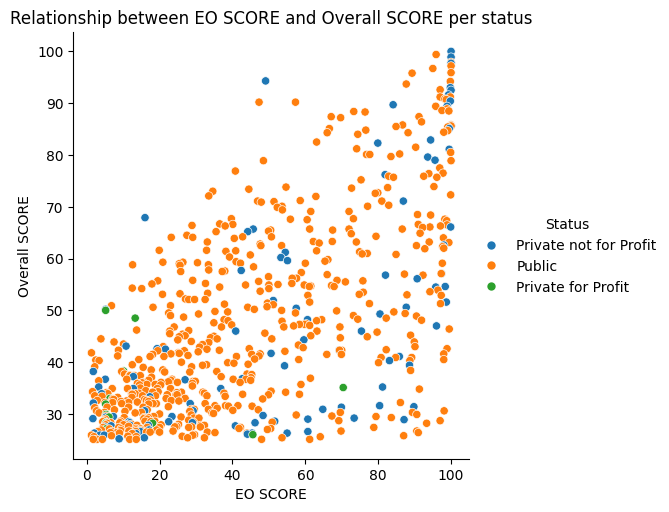

In [ ]:
sns.relplot(data=df, hue='Status', x='EO SCORE', y='Overall SCORE')
plt.title('Relationship between EO SCORE and Overall SCORE per status')
plt.show()

/tmp/ipython-input-186-777687903.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['AR SCORE'])


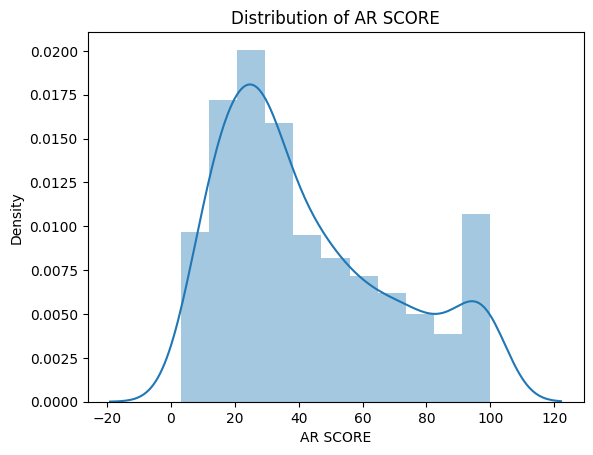

In [ ]:
sns.distplot(df['AR SCORE'])
plt.title('Distribution of AR SCORE')
plt.show()

/tmp/ipython-input-187-2312631789.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['FSR SCORE'])


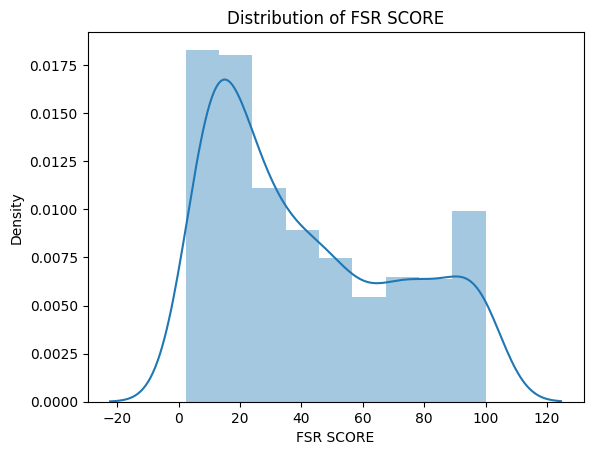

In [ ]:
sns.distplot(df['FSR SCORE'])
plt.title('Distribution of FSR SCORE')
plt.show()

/tmp/ipython-input-188-1900691162.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['CPF SCORE'])


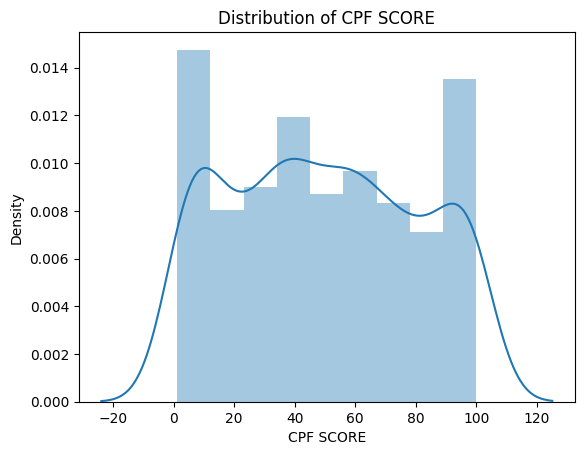

In [ ]:
sns.distplot(df['CPF SCORE'])
plt.title('Distribution of CPF SCORE')
plt.show()

/tmp/ipython-input-189-1658006153.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['IFR SCORE'])


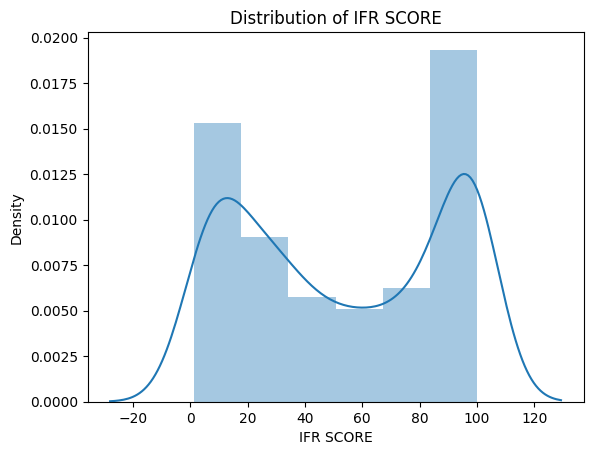

In [ ]:
sns.distplot(df['IFR SCORE'])
plt.title('Distribution of IFR SCORE')
plt.show()

/tmp/ipython-input-190-2711084265.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['ISR SCORE'])


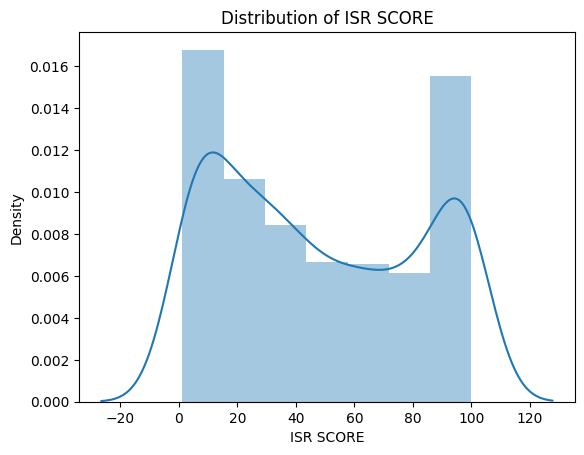

In [ ]:
sns.distplot(df['ISR SCORE'])
plt.title('Distribution of ISR SCORE')
plt.show()

/tmp/ipython-input-191-343551951.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['IRN SCORE'])


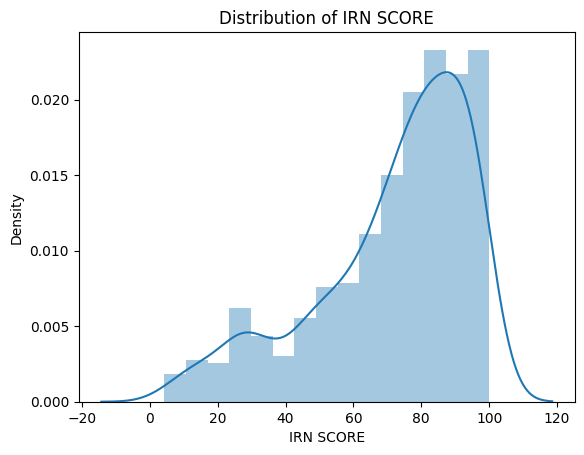

In [ ]:
sns.distplot(df['IRN SCORE'])
plt.title('Distribution of IRN SCORE')
plt.show()

/tmp/ipython-input-192-848564461.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['EO SCORE'])


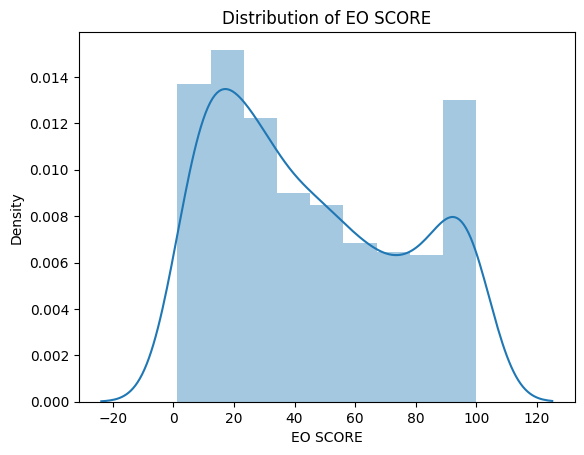

In [ ]:
sns.distplot(df['EO SCORE'])
plt.title('Distribution of EO SCORE')
plt.show()

/tmp/ipython-input-193-3055995552.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['SUS SCORE'])


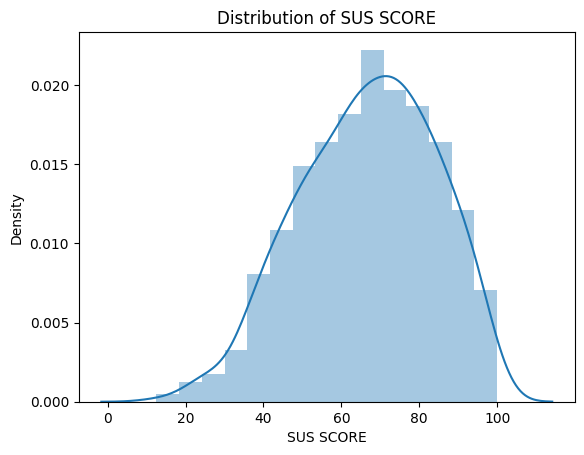

In [ ]:
sns.distplot(df['SUS SCORE'])
plt.title('Distribution of SUS SCORE')
plt.show()

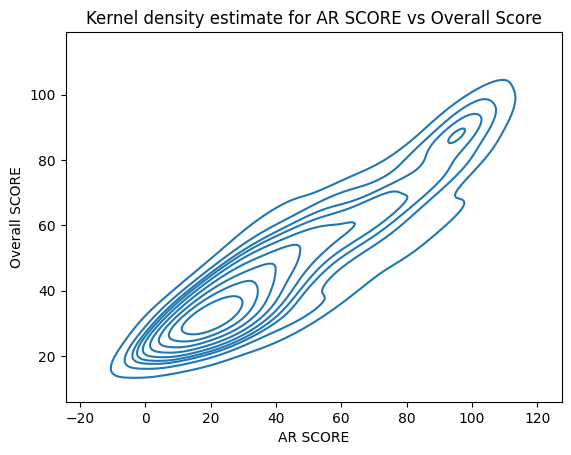

In [ ]:
sns.kdeplot(data=df, x='AR SCORE', y='Overall SCORE')
plt.title('Kernel density estimate for AR SCORE vs Overall Score')
plt.show()

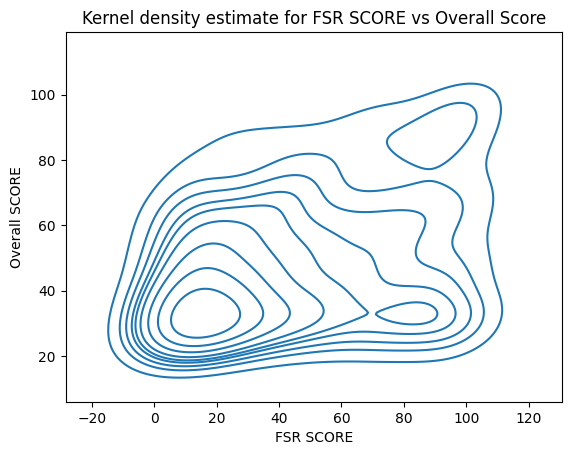

In [ ]:
sns.kdeplot(data=df, x='FSR SCORE', y='Overall SCORE')
plt.title('Kernel density estimate for FSR SCORE vs Overall Score')
plt.show()

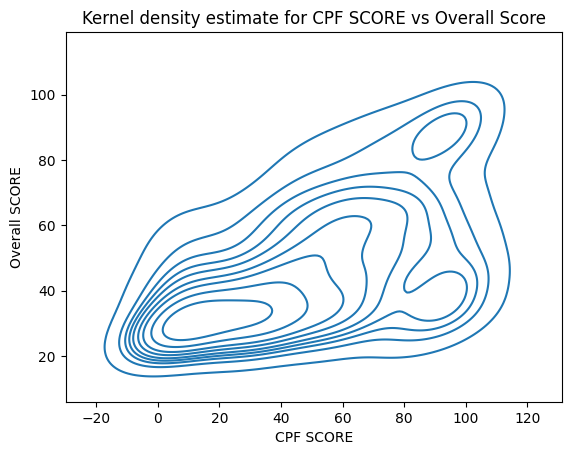

In [ ]:
sns.kdeplot(data=df, x='CPF SCORE', y='Overall SCORE')
plt.title('Kernel density estimate for CPF SCORE vs Overall Score')
plt.show()

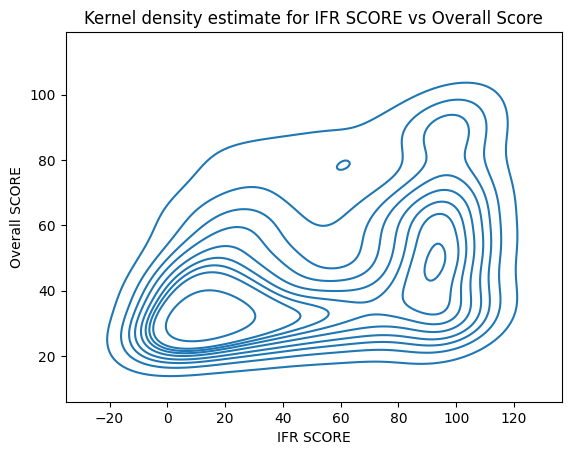

In [ ]:
sns.kdeplot(data=df, x='IFR SCORE', y='Overall SCORE')
plt.title('Kernel density estimate for IFR SCORE vs Overall Score')
plt.show()

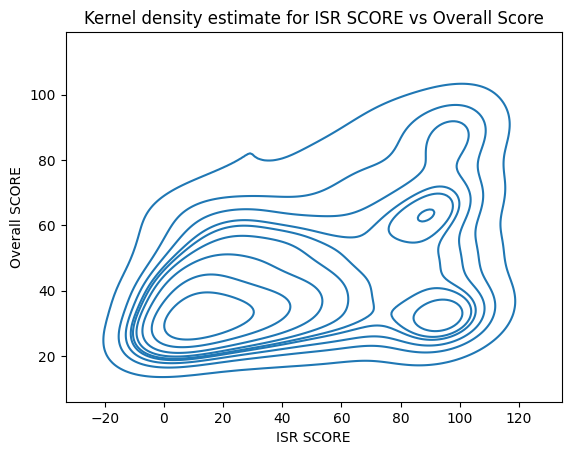

In [ ]:
sns.kdeplot(data=df, x='ISR SCORE', y='Overall SCORE')
plt.title('Kernel density estimate for ISR SCORE vs Overall Score')
plt.show()

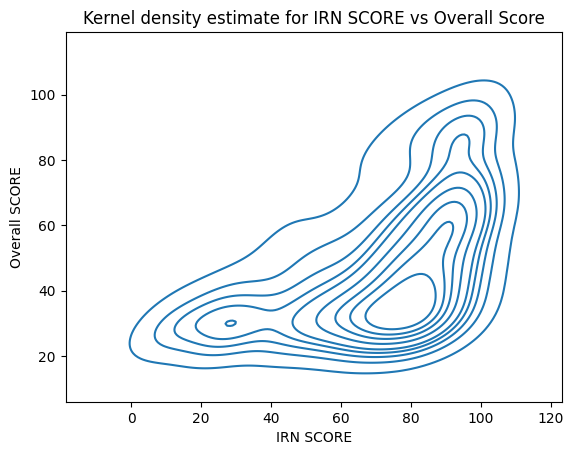

In [ ]:
sns.kdeplot(data=df, x='IRN SCORE', y='Overall SCORE')
plt.title('Kernel density estimate for IRN SCORE vs Overall Score')
plt.show()

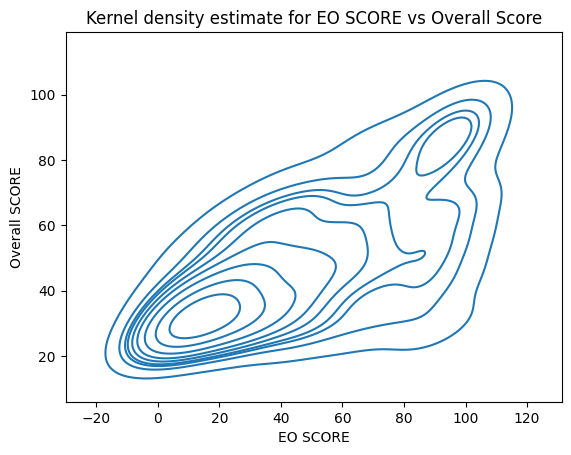

In [ ]:
sns.kdeplot(data=df, x='EO SCORE', y='Overall SCORE')
plt.title('Kernel density estimate for EO SCORE vs Overall Score')
plt.show()

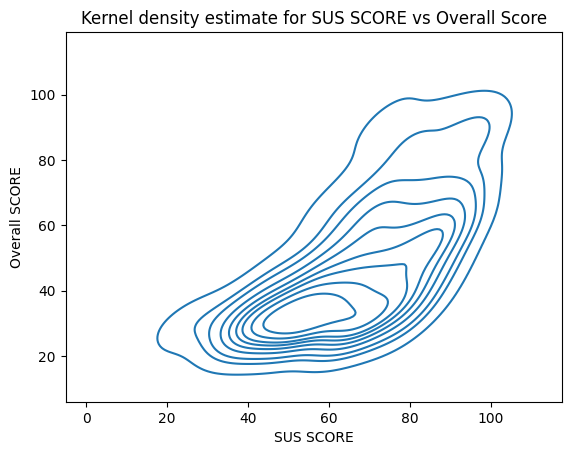

In [ ]:
sns.kdeplot(data=df, x='SUS SCORE', y='Overall SCORE')
plt.title('Kernel density estimate for SUS SCORE vs Overall Score')
plt.show()

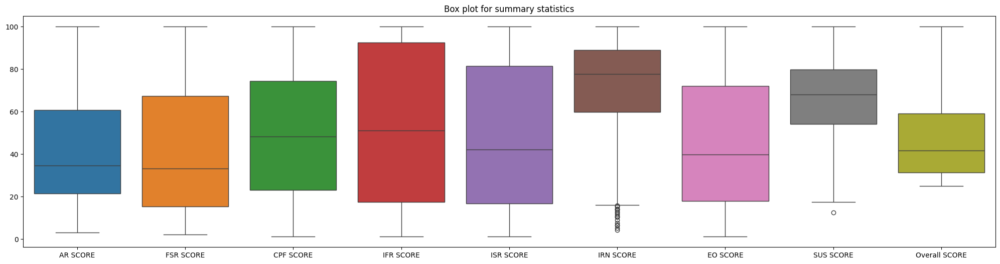

In [ ]:
# Box plots for the five summary Statistics
plt.figure(figsize=(25, 6))
sns.boxplot(df)
plt.title('Box plot for summary statistics')
plt.show()

In [ ]:
#One-hot encoding
encoding_cols = ['Region', 'Size', 'Focus', 'Research', 'Status']
encoded_df = pd.get_dummies(data=df,columns=encoding_cols, drop_first=True, dtype=int)
encoded_df.head()

,AR SCORE,FSR SCORE,CPF SCORE,IFR SCORE,ISR SCORE,IRN SCORE,EO SCORE,SUS SCORE,Overall SCORE,Region_Americas,Region_Asia,Region_Europe,Region_Oceania,Size_M,Size_S,Size_XL,Focus_FC,Focus_FO,Focus_SP,Research_MD,Research_VH,Status_Private not for Profit,Status_Public
0,100.0,100.0,100.0,100.0,91.6,94.1,100.0,93.8,100.0,1,0,0,0,1,0,0,0,0,0,0,1,1,0
1,99.6,99.3,95.0,100.0,100.0,97.5,95.9,98.3,99.4,0,0,1,0,0,0,0,0,1,0,0,1,0,1
2,100.0,100.0,99.7,94.2,73.5,96.5,100.0,95.4,98.9,1,0,0,0,0,0,0,1,0,0,0,1,1,0
3,100.0,100.0,91.0,98.8,98.6,100.0,100.0,77.9,97.9,0,0,1,0,0,0,0,1,0,0,0,1,0,1
4,100.0,98.3,100.0,79.1,81.4,99.4,100.0,77.8,97.7,1,0,0,0,0,0,0,1,0,0,0,1,1,0


In [ ]:
#Split data into test and train
features = encoded_df.drop('Overall SCORE', axis=1)
target = encoded_df['Overall SCORE']
x_train, x_test, y_train, y_test = train_test_split(features, target, test_size=0.1)

In [ ]:
#Naive baseline
y_train_mean = np.mean(y_train)
naive_prediction = [y_train_mean] * len(y_train)

mae = mean_absolute_error(y_train, naive_prediction)
mse = mean_squared_error(y_train, naive_prediction)
r2 = r2_score(y_train, naive_prediction)
print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R2 Score: {r2}')

MAE: 15.695975849202163
MSE: 357.82562422151443
R2 Score: 0.0


In [ ]:
# Fit all the models and select the best one
results = []
model_pipeline = {
    'Ridge': Pipeline([
    ('scaler', StandardScaler()),
    ('model', Ridge())]),
    'Lasso': Pipeline([
    ('scaler', StandardScaler()),
    ('model', Lasso())]),
    'RidgeCV': Pipeline([
    ('scaler', StandardScaler()),
    ('model', RidgeCV())]),
    'LassoCV': Pipeline([
    ('scaler', StandardScaler()),
    ('model', LassoCV())]),
    'Linear_regression': Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())]),
    'ElasticNetCV': Pipeline([
    ('scaler', StandardScaler()),
    ('model', ElasticNetCV(cv=5, random_state=45))])
}

for name, model in model_pipeline.items():
  model.fit(x_train, y_train)
  y_predicted = model.predict(x_test)
  mae = mean_absolute_error(y_test, y_predicted)
  mse = mean_squared_error(y_test, y_predicted)
  r2 = r2_score(y_test, y_predicted)
  results.append({'Name': name,
                  'mae': mae,
                  'mse': mse,
                  'r2_score': r2})
print(results)

[{'Name': 'Ridge', 'mae': 1.5630153283014, 'mse': 3.824577740233024, 'r2_score': 0.989194845108594}, {'Name': 'Lasso', 'mae': 2.080857977437209, 'mse': 7.333820042839139, 'r2_score': 0.9792805724211148}, {'Name': 'RidgeCV', 'mae': 1.5630153283028927, 'mse': 3.824577740250775, 'r2_score': 0.9891948451085438}, {'Name': 'LassoCV', 'mae': 1.5630983654547876, 'mse': 3.899675377325456, 'r2_score': 0.9889826800917279}, {'Name': 'Linear_regression', 'mae': 1.561412753315516, 'mse': 3.820581508466383, 'r2_score': 0.9892061352185495}, {'Name': 'ElasticNetCV', 'mae': 1.5855676076606775, 'mse': 3.974558335322819, 'r2_score': 0.9887711215838758}]


In [ ]:
# Selected the Linear regression model due to lower MAE and MSE and relatively high r2 score
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())
])

In [ ]:
# Train the model
pipeline.fit(x_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('model', LinearRegression())])

In [ ]:
# test the model by predicting the y_test
y_predicted = pipeline.predict(x_test)

In [ ]:
#Create a new dataframe with y_test and y_predicted for comparison
combined_df = pd.DataFrame({'actual y': y_test, 'predicted y' : y_predicted})

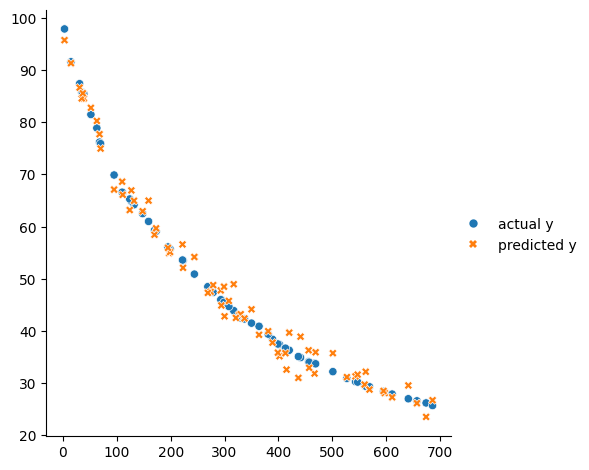

In [ ]:
sns.relplot(combined_df)
plt.title('Relationship between actual y and predicted y')
plt.show()